In [ ]:
import zipfile
import os
import time
import random

from google.colab import drive
from PIL import Image, ImageDraw

from pathlib import Path
from tqdm import tqdm
import numpy as np
import json
import urllib
import PIL.Image as Image
import cv2
import torch
import torchvision
from IPython.display import display
from sklearn.model_selection import train_test_split
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
rcParams['figure.figsize'] = 16, 10
np.random.seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
zip_file = '/content/gdrive/MyDrive/data/faces/wider_face_dataset/WIDER_train.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall('/content/data/unprocessed/wider_face/')

In [ ]:
zip_file = '/content/gdrive/MyDrive/data/faces/masks_only.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall('/content/data/unprocessed/masks_only/')

In [ ]:
from google.colab import files 
files.upload()

Saving wider_face_train_bbx_gt.txt to wider_face_train_bbx_gt.txt
Saving wider_face_val_bbx_gt.txt to wider_face_val_bbx_gt.txt


{'wider_face_train_bbx_gt.txt': b'0--Parade/0_Parade_marchingband_1_849.jpg\n1\n449 330 122 149 0 0 0 0 0 0 \n0--Parade/0_Parade_Parade_0_904.jpg\n1\n361 98 263 339 0 0 0 0 0 0 \n0--Parade/0_Parade_marchingband_1_799.jpg\n21\n78 221 7 8 2 0 0 0 0 0 \n78 238 14 17 2 0 0 0 0 0 \n113 212 11 15 2 0 0 0 0 0 \n134 260 15 15 2 0 0 0 0 0 \n163 250 14 17 2 0 0 0 0 0 \n201 218 10 12 2 0 0 0 0 0 \n182 266 15 17 2 0 0 0 0 0 \n245 279 18 15 2 0 0 0 0 0 \n304 265 16 17 2 0 0 0 2 1 \n328 295 16 20 2 0 0 0 0 0 \n389 281 17 19 2 0 0 0 2 0 \n406 293 21 21 2 0 1 0 0 0 \n436 290 22 17 2 0 0 0 0 0 \n522 328 21 18 2 0 1 0 0 0 \n643 320 23 22 2 0 0 0 0 0 \n653 224 17 25 2 0 0 0 0 0 \n793 337 23 30 2 0 0 0 0 0 \n535 311 16 17 2 0 0 0 1 0 \n29 220 11 15 2 0 0 0 0 0 \n3 232 11 15 2 0 0 0 2 0 \n20 215 12 16 2 0 0 0 2 0 \n0--Parade/0_Parade_marchingband_1_117.jpg\n9\n69 359 50 36 1 0 0 0 0 1 \n227 382 56 43 1 0 1 0 0 1 \n296 305 44 26 1 0 0 0 0 1 \n353 280 40 36 2 0 0 0 2 1 \n885 377 63 41 1 0 0 0 0 1 \n819 391 3

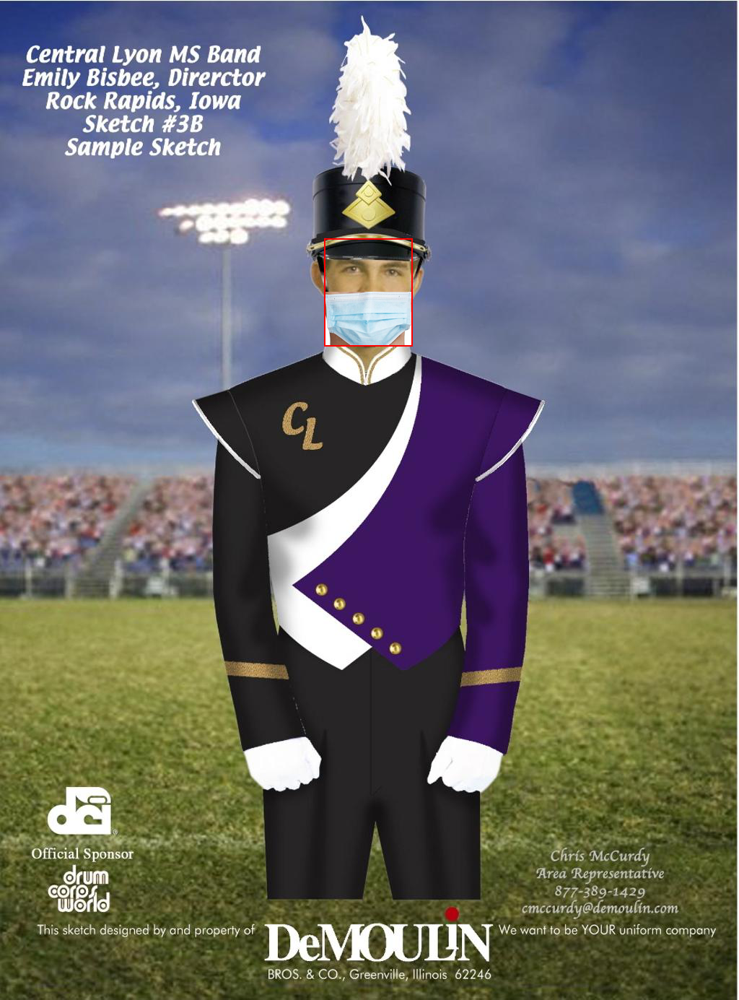

In [ ]:
with open('/content/wider_face_train_bbx_gt.txt') as f:
  name = f.readline().strip()
  num_faces = int(f.readline())
  bbx = []
  for i in range(num_faces):
    bbx.append(f.readline().split())

  masks_path = '/content/data/unprocessed/masks_only/masks_only/'
  masks = [Image.open(masks_path + name) for name in os.listdir(masks_path)]
  
  img = Image.open('/content/data/unprocessed/wider_face/WIDER_train/images/' + name)
  img_draw = img.copy()
  draw = ImageDraw.Draw(img_draw)
  for b in bbx:
    b = [int(bi) for bi in b]
    mask = masks[22].resize((b[2], int(b[3] / 2)))
    img_draw.paste(mask, (b[0], b[1] + int(b[3] / 2)))

    draw.rectangle([b[0], b[1], b[0] + b[2], b[1] + b[3]], outline=(255, 0, 0), width=2)

img_draw

In [ ]:
def without_folder(name):
  parts = name.strip().split('/')
  return ''.join(parts[1:])

In [ ]:
def process_wider_face(input_images_path, input_labels_path, dataset_type):
  images_path = Path(f"faces/images/{dataset_type}")
  images_path.mkdir(parents=True, exist_ok=True)

  labels_path = Path(f"faces/labels/{dataset_type}")
  labels_path.mkdir(parents=True, exist_ok=True)

  masks_path = '/content/data/unprocessed/masks_only/masks_only/'
  masks = [Image.open(masks_path + name) for name in os.listdir(masks_path)]

  with open(input_labels_path) as f:
    j = 0
    while True:
      name = f.readline().strip()
      if name == '':
        break

      img = Image.open(input_images_path + name)
      img = img.convert('RGB')

      label_name = without_folder(name).split('.')[0] + '.txt'
      
      num_faces = int(f.readline())
      if num_faces > 0:
        with(labels_path / label_name).open(mode='w') as label_file:       
          w, h = img.size
          for i in range(num_faces):
            box = [int(i) for i in f.readline().split()]
            no_mask = random.randint(0, 1)
            if not no_mask:
              try:
                mask = masks[random.randint(0, 22)].resize((box[2], int(box[3] / 2)))
                img.paste(mask, (box[0], box[1] + int(box[3] / 2)))
              except ValueError:
                print(box[2], int(box[3] / 2))
                no_mask = 1
            
            x1, y1 = (box[0]) / w, (box[1]) / h
            bw, bh = (box[2]) / w, (box[3]) / h
            label_file.write(f"{no_mask} {x1 + bw / 2} {y1 + bh / 2} {bw} {bh}\n")
      else:
        empty_box = f.readline()
      
      img.save(str(images_path / without_folder(name)), "JPEG")
      
      # print(j, name)
      # j += 1

In [ ]:
process_wider_face(
    input_images_path='/content/data/unprocessed/wider_face/WIDER_train/images/',
    input_labels_path='/content/wider_face_train_bbx_gt.txt',
    dataset_type='train'
)

3 0
0 0
0 0
4 0
5 0
0 1
0 1
0 0
0 2
0 3
0 4
0 4
1 0
0 2
0 25
0 2


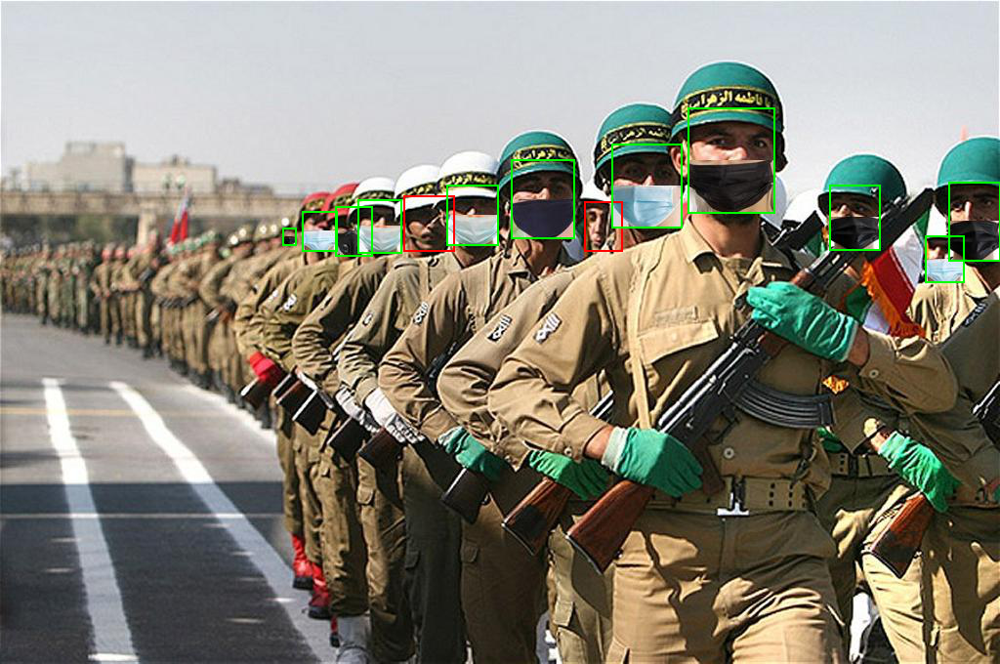

In [ ]:
def test_dataset():
  image = Image.open('faces/images/train/0_Parade_Parade_0_1019.jpg')

  img_draw = image.copy()
  draw = ImageDraw.Draw(img_draw)
  with open('faces/labels/train/0_Parade_Parade_0_1019.txt') as f:
    for box in f:
      box = box.strip().split()
      x, y, bw, bh = float(box[1]), float(box[2]), float(box[3]), float(box[4])
      w, h = image.size

      x1, y1 = (x - bw / 2) * w, (y - bh / 2) * h
      x2, y2 = x1 + bw * w, y1 + bh * h

      outline = (255, 0, 0) if int(box[0]) else (0, 255, 0)
      draw.rectangle([x1, y1, x2, y2], outline=outline, width=2)
  
  return img_draw

test_dataset()

In [ ]:
len(os.listdir('/content/faces/images/train/'))

12880

In [ ]:
zip_file = '/content/gdrive/MyDrive/data/faces/wider_face_dataset/WIDER_val.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall('/content/data/unprocessed/wider_face/')

In [ ]:
process_wider_face(
    input_images_path='/content/data/unprocessed/wider_face/WIDER_val/images/',
    input_labels_path='/content/wider_face_val_bbx_gt.txt',
    dataset_type='val'
)

0 0
0 1
0 1
11 0
0 0
16 0


In [ ]:
len(os.listdir('/content/faces/images/val/'))

3226

In [ ]:
!zip -r '/content/gdrive/MyDrive/data/faces/wider_face_darknet.zip' '/content/faces'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/faces/labels/train/18_Concerts_Concerts_18_898.txt (deflated 25%)
  adding: content/faces/labels/train/36_Football_americanfootball_ball_36_441.txt (deflated 50%)
  adding: content/faces/labels/train/9_Press_Conference_Press_Conference_9_145.txt (deflated 21%)
  adding: content/faces/labels/train/40_Gymnastics_Gymnastics_40_737.txt (deflated 70%)
  adding: content/faces/labels/train/0_Parade_Parade_0_337.txt (deflated 71%)
  adding: content/faces/labels/train/12_Group_Team_Organized_Group_12_Group_Team_Organized_Group_12_150.txt (deflated 65%)
  adding: content/faces/labels/train/32_Worker_Laborer_Worker_Laborer_32_632.txt (deflated 38%)
  adding: content/faces/labels/train/42_Car_Racing_Nascar_42_530.txt (deflated 15%)
  adding: content/faces/labels/train/39_Ice_Skating_iceskiing_39_148.txt (deflated 52%)
  adding: content/faces/labels/train/24_Soldier_Firing_Soldier_Firing_24_859.txt (deflated 57%)


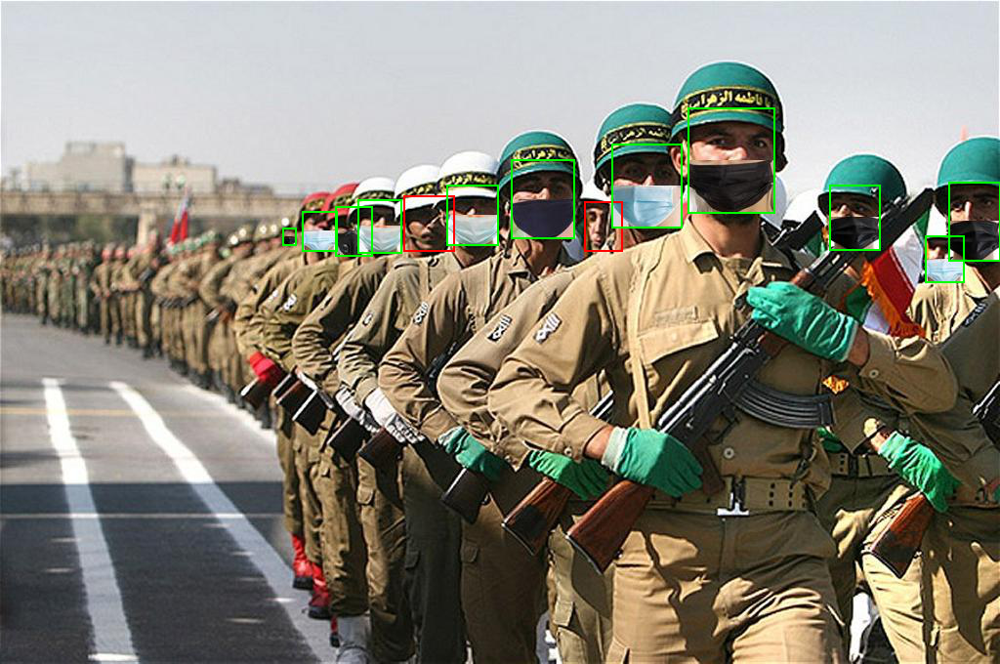

In [ ]:
test_dataset()

In [ ]:
zip_file = '/content/gdrive/MyDrive/data/faces/kaggle_dataset/archive.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall('/content/data/unprocessed/kaggle/')

In [ ]:
import cv2
import xml.etree.ElementTree as ET
import xml.dom.minidom as minidom

def process_kaggle(input_images_path, input_labels_path, all_to_val = 5, kaggle_name='kaggle'):
    mask_count = 0
    images_path_train = Path(f"faces/images/train")
    images_path_train.mkdir(parents=True, exist_ok=True)
    images_path_val = Path(f"faces/images/val")
    images_path_val.mkdir(parents=True, exist_ok=True)

    labels_path_train = Path(f"faces/labels/train")
    labels_path_train.mkdir(parents=True, exist_ok=True)
    labels_path_val = Path(f"faces/labels/val")
    labels_path_val.mkdir(parents=True, exist_ok=True)

    i = 0
    labels = os.listdir(input_labels_path)
    for label_name in labels:
      i += 1
      cur_images_path = images_path_val if i % all_to_val == 0 else images_path_train
      cur_labels_path = labels_path_val if i % all_to_val == 0 else labels_path_train
      annotation = minidom.parse(input_labels_path + label_name)

      img_name = annotation.getElementsByTagName('filename')[0].firstChild.data
      img = Image.open(input_images_path + img_name)
      img = img.convert('RGB')
      img.save(str(cur_images_path / f'{kaggle_name}{i}.jpg'), "JPEG")

      with(cur_labels_path / f'{kaggle_name}{i}.txt').open(mode='w') as label_file:
        objects = annotation.getElementsByTagName('object')
        for obj in objects:
          bndbox = obj.getElementsByTagName('bndbox')[0]
          xmin = int(bndbox.getElementsByTagName('xmin')[0].firstChild.data)
          ymin = int(bndbox.getElementsByTagName('ymin')[0].firstChild.data)
          xmax = int(bndbox.getElementsByTagName('xmax')[0].firstChild.data)
          ymax = int(bndbox.getElementsByTagName('ymax')[0].firstChild.data)

          label = obj.getElementsByTagName('name')[0].firstChild.data
          if kaggle_name == 'kaggle': 
            label_id = 0 if label == 'mask' else 1
          else:
            label_id = 0 if label == 'with_mask' else 1
          mask_count += (1 - label_id)
          w, h = img.size
          x, y = (xmin + xmax) / 2 / w, (ymin + ymax) / 2 / h
          bw, bh = abs(xmax - xmin) / w, abs(ymax - ymin) / h
          
          label_file.write(f'{label_id} {x} {y} {bw} {bh}\n')
    print(mask_count)

In [ ]:
process_kaggle(
    input_images_path='/content/data/unprocessed/kaggle/medical-masks-dataset/images/',
    input_labels_path='/content/data/unprocessed/kaggle/medical-masks-dataset/labels/',
)

4154


In [ ]:
def test_dataset(name):
  image = Image.open(f'faces/images/{name}.jpg')

  img_draw = image.copy()
  draw = ImageDraw.Draw(img_draw)
  with open(f'faces/labels/{name}.txt') as f:
    for box in f:
      box = box.strip().split()
      x, y, bw, bh = float(box[1]), float(box[2]), float(box[3]), float(box[4])
      w, h = image.size

      x1, y1 = (x - bw / 2) * w, (y - bh / 2) * h
      x2, y2 = x1 + bw * w, y1 + bh * h
      
      outline = (255, 0, 0) if int(box[0]) else (0, 255, 0)
      draw.rectangle([x1, y1, x2, y2], outline=outline, width=2)
  
  return img_draw

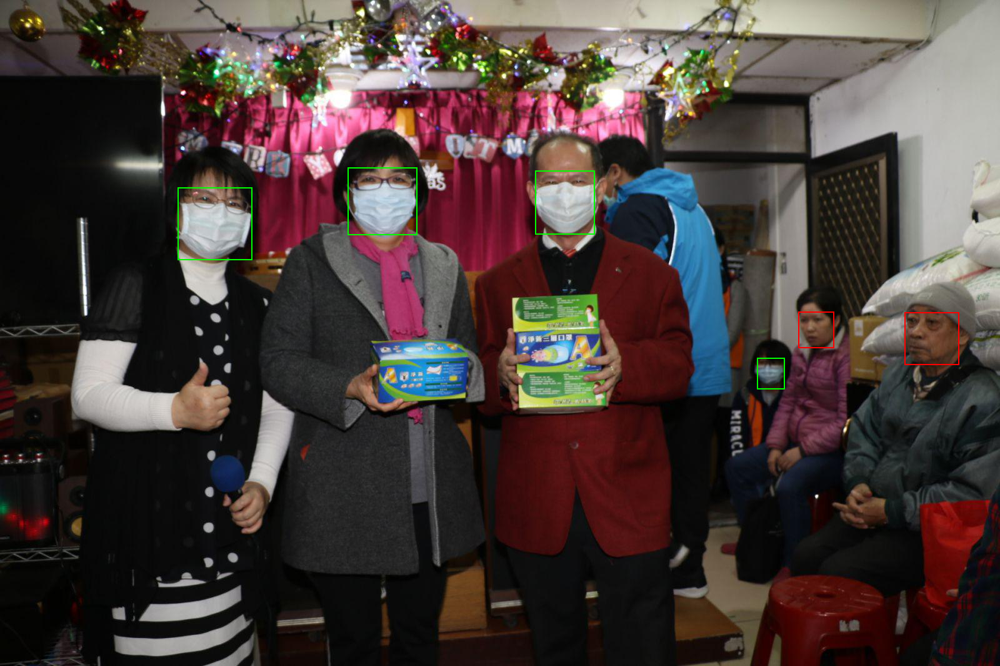

In [ ]:
test_dataset('train/kaggle221')

In [ ]:
print(len(os.listdir('/content/faces/images/val/')))

3455


In [ ]:
zip_file = '/content/gdrive/MyDrive/data/faces/kaggle_dataset2/archive.zip'
z = zipfile.ZipFile(zip_file, 'r')
z.extractall('/content/data/unprocessed/kaggle2/')

In [ ]:
process_kaggle(
    input_images_path='/content/data/unprocessed/kaggle2/images/',
    input_labels_path='/content/data/unprocessed/kaggle2/annotations/',
    kaggle_name='kaggle2_'
)

3232


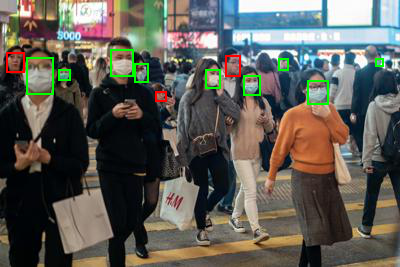

In [ ]:
test_dataset('train/kaggle2_13')

In [ ]:
print(len(os.listdir('/content/faces/images/val/')), len(os.listdir('/content/faces/images/train/'))) 

3625 14482


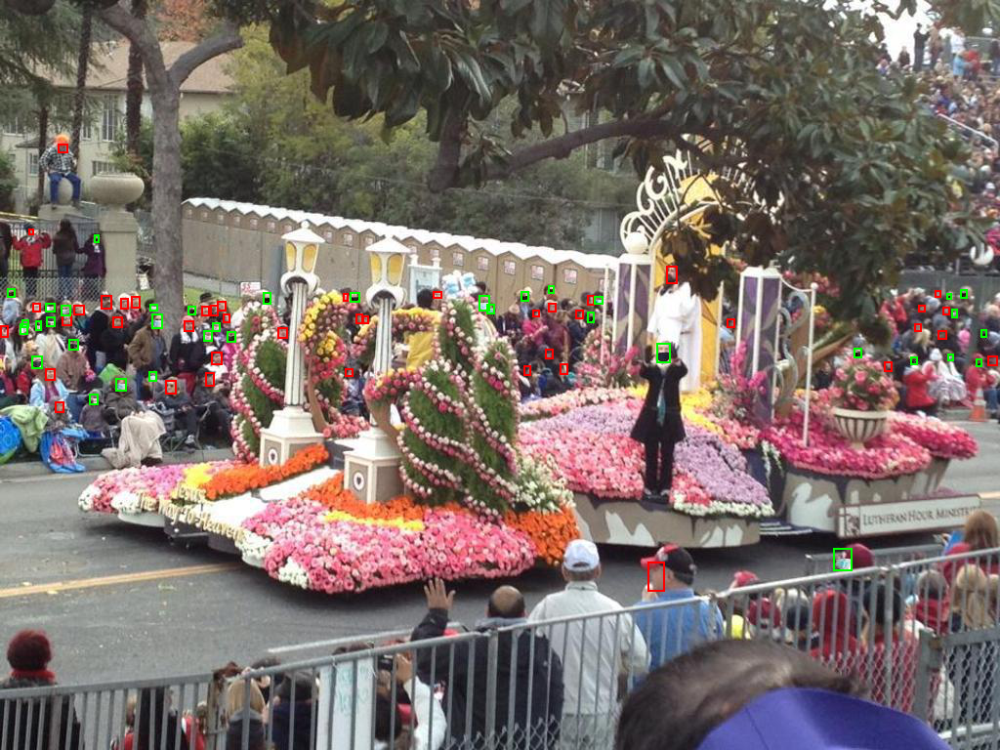

In [ ]:
test_dataset('train/0_Parade_Parade_0_136')

In [ ]:
!zip -r '/content/gdrive/MyDrive/data/faces/wider_kaggle_darknet.zip' '/content/faces'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/faces/labels/train/kaggle834.txt (deflated 65%)
  adding: content/faces/labels/train/3_Riot_Riot_3_338.txt (deflated 22%)
  adding: content/faces/labels/train/2_Demonstration_Demonstrators_2_371.txt (deflated 86%)
  adding: content/faces/labels/train/35_Basketball_playingbasketball_35_247.txt (deflated 39%)
  adding: content/faces/labels/train/0_Parade_Parade_0_343.txt (deflated 65%)
  adding: content/faces/labels/train/58_Hockey_icehockey_puck_58_596.txt (deflated 22%)
  adding: content/faces/labels/train/25_Soldier_Patrol_Soldier_Patrol_25_158.txt (deflated 24%)
  adding: content/faces/labels/train/12_Group_Group_12_Group_Group_12_613.txt (deflated 64%)
  adding: content/faces/labels/train/31_Waiter_Waitress_Waiter_Waitress_31_348.txt (deflated 17%)
  adding: content/faces/labels/train/18_Concerts_Concerts_18_442.txt (deflated 61%)
  adding: content/faces/labels/train/2_Demonstration_Protesters_2_28